In [1]:
import velvetvae as vt

# general packages
import numpy as np
import pandas as pd
import torch
from scipy.sparse import issparse

# velocity packages
import scanpy as sc
import scvelo as scv
import anndata as ann

# plotting packages
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm, trange
from IPython.display import clear_output

# color palette object
from colors import colorpalette as colpal

Global seed set to 0
/camp/home/maizelr/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/camp/home/maizelr/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
from sklearn.preprocessing import StandardScaler

import anndata
anndata.__version__

'0.8.0'

In [3]:
adata0 = vt.pp.read("../data/celltyped_adata.h5ad")
adata0 = adata0[adata0.obs.cell_annotation!='other']

adata0

View of AnnData object with n_obs × n_vars = 44713 × 24967
    obs: 'X_TC_alpha', 'total_TC_alpha', 'unspliced_TC_alpha', 'spliced_TC_alpha', 'p_e', 'p_c_TC', 'sample', 'timepoint', 'rep', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'label_rate', 'doublet_score', 'marker_based_classification', 'cell_annotation'
    layers: 'new', 'old', 'total'

# Neural, labelling, with NC

In [4]:
neural_types = ['Early_Neural','Neural','pMN','p3','FP','MN','V3']

neural = adata0[[ct in neural_types for ct in adata0.obs.cell_annotation]]

neural_genes = vt.pp.select_genes(
    neural[neural.obs.rep!='r4'], 
    n_variable_genes=3000, 
    stratify_obs='rep')

In [5]:
neural = vt.pp.size_normalize(
    neural, 
    genes=neural_genes, 
    total_layer='total', 
    new_layer='new',
    unsparsify=True
)

vt.pp.neighborhood(neural)

Using ScanPy methods to calculate distances, indices, connectivities, transitions, ... done! 
KNN indices for Velvet stored in .obsm['knn_index'].
Dense similarity transition matrix for Velvet stored in .obsm['Ts'].


In [6]:
neural = neural.copy()

vt.ut.set_seed(0)

vt.md.Velvet.setup_anndata(neural, x_layer='total', n_layer='new', knn_layer='knn_index')

model = vt.md.Velvet(
    neural,
    n_latent = 50,
    linear_decoder = True,
    neighborhood_space="latent_space",
    biophysical_model = "full",
    gamma_mode = "learned",
    labelling_time = 2.0,
)

model.setup_model()

INFO     Generating sequential column names                                                                        


In [7]:
model.train(
    batch_size = neural.shape[0],
    max_epochs = 1000, 
    freeze_vae_after_epochs = 200,
    constrain_vf_after_epochs = 200,
    lr=0.001,
)

Multiprocessing is handled by SLURM.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 1000/1000: 100%|██████████| 1000/1000 [09:49<00:00,  1.95it/s, loss=2.16, v_num=1]  

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [09:49<00:00,  1.70it/s, loss=2.16, v_num=1]


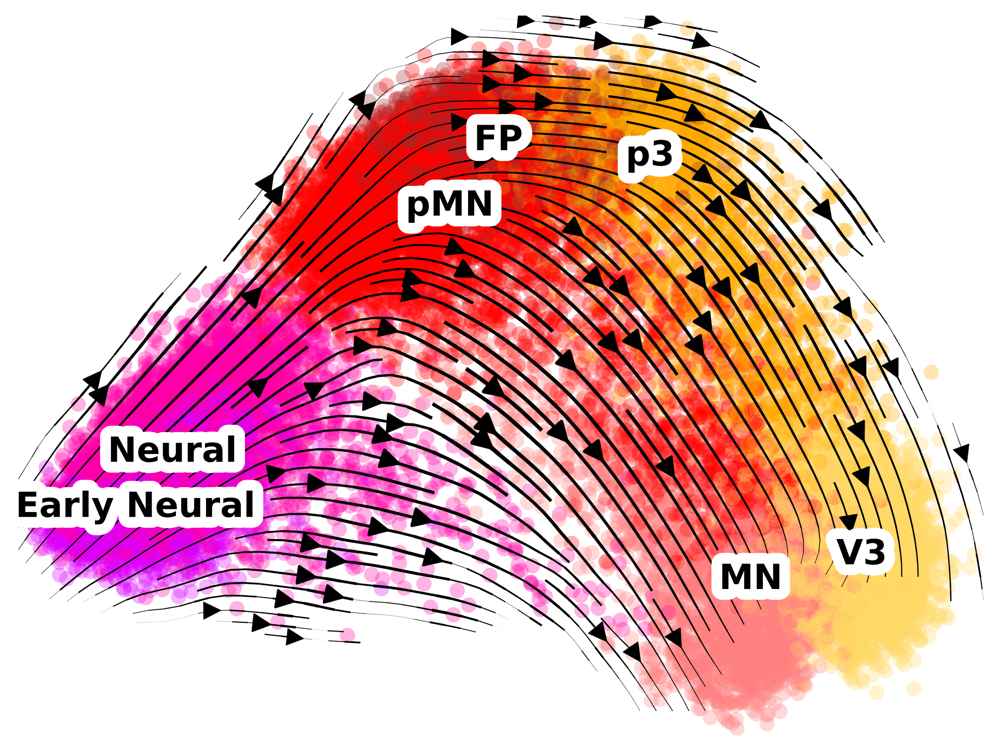

In [12]:
X = model.adata_manager.get_from_registry("X")
X = X.A if issparse(X) else X
torch_device = 'cuda' if torch.cuda.is_available() else 'cpu'

x = torch.tensor(X, device=torch_device)
b = torch.zeros(X.shape[0], device=torch_device)

z = model.module.inference(x, b)['z']
v = model.module.vf(z)

pca = PCA(n_components=10)
zs = z.detach().cpu().numpy()
zfs = (z+v).detach().cpu().numpy()
z_pca = pca.fit_transform(zs)
zf_pca = pca.transform(zfs)
v_pca = zf_pca - z_pca

copy = model.adata.copy()
copy.obsm['X_vae'] = z_pca
copy.obsm['velocity_vae'] = v_pca
copy.uns["velocity_params"] = {'embeddings':'vae'}

fig = plt.figure(figsize=(8,6), dpi=300)

ax = fig.subplots()

scv.pl.velocity_embedding_stream(
    copy, 
    basis='vae', 
    title="",
    color='cell_annotation', 
    show=False,
    ax=ax,
    palette=colpal.celltype,
    arrow_size=2,
    legend_fontoutline=10,
    size=200,
    fontsize=16, 
    legend_fontsize=16, components='1,2'
)
plt.savefig('../figures/2.0.2.1_neural_labelling_with_NC.png', transparent=True)
plt.show()

# Neural, labelling, without NC

In [20]:
neural = neural.copy()

vt.ut.set_seed(0)

vt.md.Velvet.setup_anndata(neural, x_layer='total', n_layer='new', knn_layer='knn_index')

model2 = vt.md.Velvet(
    neural,
    n_latent = 50,
    linear_decoder = True,
    neighborhood_space="none",
    biophysical_model = "full",
    gamma_mode = "learned",
    labelling_time = 2.0,
)

model2.setup_model()

INFO     Generating sequential column names                                                                        


In [21]:
model2.train(
    batch_size = neural.shape[0],
    max_epochs = 200, 
    freeze_vae_after_epochs = 201,
    constrain_vf_after_epochs = 201,
    lr=0.001,
)

Multiprocessing is handled by SLURM.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 200/200: 100%|██████████| 200/200 [02:04<00:00,  1.53it/s, loss=1.9e+03, v_num=1] 

`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 200/200: 100%|██████████| 200/200 [02:04<00:00,  1.61it/s, loss=1.9e+03, v_num=1]


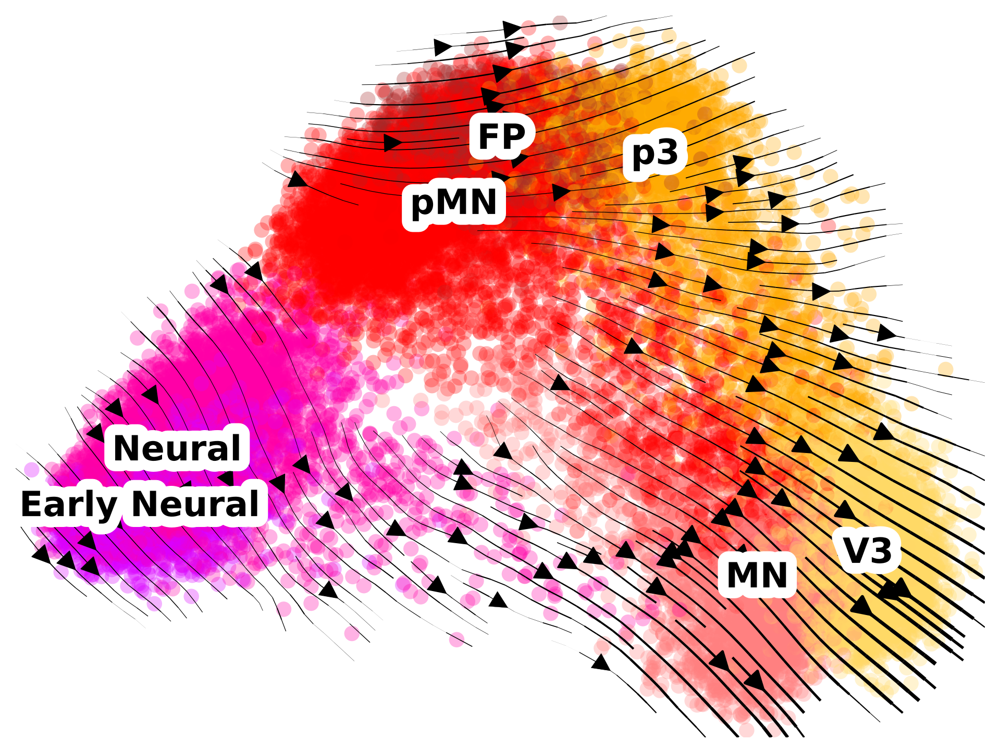

In [25]:
X = model2.adata_manager.get_from_registry("X")
X = X.A if issparse(X) else X
torch_device = 'cuda' if torch.cuda.is_available() else 'cpu'

x = torch.tensor(X, device=torch_device)
b = torch.zeros(X.shape[0], device=torch_device)

z = model2.module.inference(x, b)['z']
v = model2.module.vf(z)

pca = PCA(n_components=10)
zs = z.detach().cpu().numpy()
zfs = (z+v).detach().cpu().numpy()
z_pca = pca.fit_transform(zs)
zf_pca = pca.transform(zfs)
v_pca = zf_pca - z_pca

copy = model2.adata.copy()
copy.obsm['X_vae'] = z_pca
copy.obsm['velocity_vae'] = v_pca
copy.uns["velocity_params"] = {'embeddings':'vae'}

fig = plt.figure(figsize=(8,6), dpi=300)

ax = fig.subplots()

scv.pl.velocity_embedding_stream(
    copy, 
    basis='vae', 
    title="",
    color='cell_annotation', 
    show=False,
    ax=ax,
    palette=colpal.celltype,
    arrow_size=2,
    legend_fontoutline=10,
    size=200,
    fontsize=16, 
    legend_fontsize=16, components='1,2'
)
plt.savefig('../figures/2.0.2.2_neural_labelling_without_NC.png', transparent=True)
plt.show()

# Neural, labelling, simple biophysical model

In [26]:
neural = neural.copy()

vt.ut.set_seed(0)

vt.md.Velvet.setup_anndata(neural, x_layer='total', n_layer='new', knn_layer='knn_index')

model3 = vt.md.Velvet(
    neural,
    n_latent = 50,
    linear_decoder = True,
    neighborhood_space="latent_space",
    biophysical_model = "simple",
    gamma_mode = "learned",
    labelling_time = 2.0,
)

model3.setup_model()

INFO     Generating sequential column names                                                                        


In [27]:
model3.train(
    batch_size = neural.shape[0],
    max_epochs = 1000, 
    freeze_vae_after_epochs = 200,
    constrain_vf_after_epochs = 200,
    lr=0.001,
)

Multiprocessing is handled by SLURM.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 1000/1000: 100%|██████████| 1000/1000 [09:41<00:00,  1.49it/s, loss=2.16, v_num=1]  

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [09:41<00:00,  1.72it/s, loss=2.16, v_num=1]


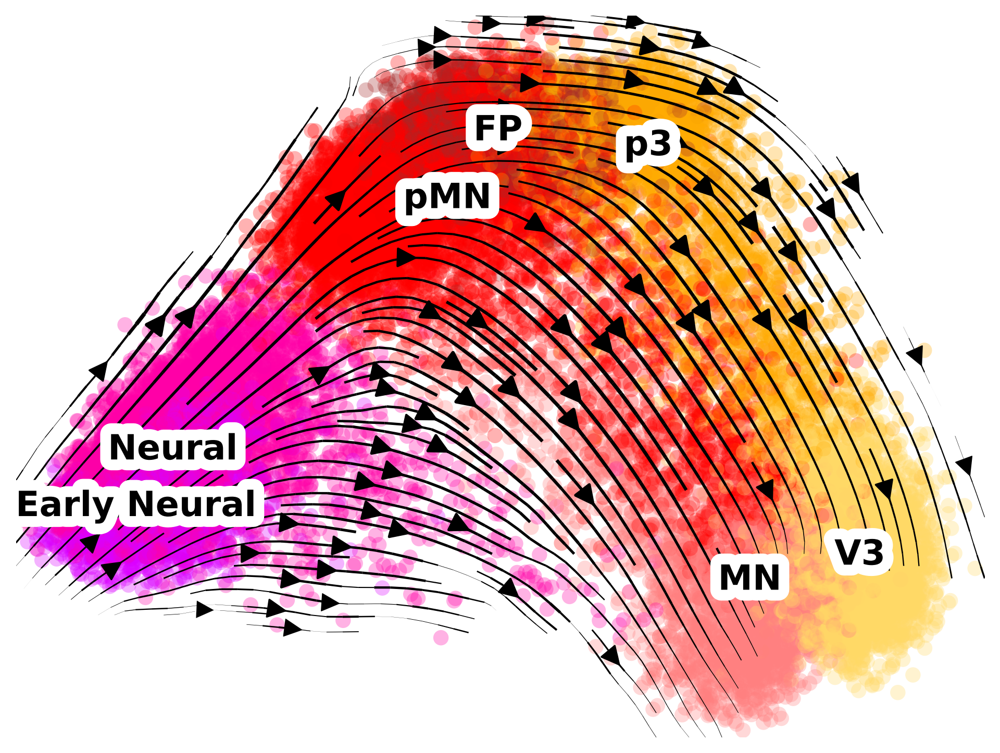

In [30]:
X = model3.adata_manager.get_from_registry("X")
X = X.A if issparse(X) else X
torch_device = 'cuda' if torch.cuda.is_available() else 'cpu'

x = torch.tensor(X, device=torch_device)
b = torch.zeros(X.shape[0], device=torch_device)

z = model3.module.inference(x, b)['z']
v = model3.module.vf(z)

pca = PCA(n_components=10)
zs = z.detach().cpu().numpy()
zfs = (z+v).detach().cpu().numpy()
z_pca = pca.fit_transform(zs)
zf_pca = pca.transform(zfs)
v_pca = zf_pca - z_pca

copy = model3.adata.copy()
copy.obsm['X_vae'] = z_pca
copy.obsm['velocity_vae'] = v_pca
copy.uns["velocity_params"] = {'embeddings':'vae'}

fig = plt.figure(figsize=(8,6), dpi=300)

ax = fig.subplots()

scv.pl.velocity_embedding_stream(
    copy, 
    basis='vae', 
    title="",
    color='cell_annotation', 
    show=False,
    ax=ax,
    palette=colpal.celltype,
    arrow_size=2,
    legend_fontoutline=10,
    size=200,
    fontsize=16, 
    legend_fontsize=16, components='1,2'
)
plt.savefig('../figures/2.0.2.3_neural_labelling_simple_model.png', transparent=True)
plt.show()

# Neuron, labelling, NC+, smoothing

# splicing

In [36]:
adata0 = vt.pp.read("../data/celltyped_adata_splicing.h5ad")
adata0 = adata0[adata0.obs.cell_annotation!='other']

adata0

View of AnnData object with n_obs × n_vars = 44713 × 24967
    obs: 'X_TC_alpha', 'total_TC_alpha', 'unspliced_TC_alpha', 'spliced_TC_alpha', 'p_e', 'p_c_TC', 'sample', 'timepoint', 'rep', 'marker_based_classification', 'cell_annotation'
    layers: 'spliced', 'unspliced'

In [37]:
neural_types = ['Early_Neural','Neural','pMN','p3','FP','MN','V3']

neural = adata0[[ct in neural_types for ct in adata0.obs.cell_annotation]]

neural_genes = vt.pp.select_genes(
    neural[neural.obs.rep!='r4'], 
    n_variable_genes=3000, 
    stratify_obs='rep')

neural = vt.pp.size_normalize_splicing(
    neural, 
    genes=neural_genes, 
    spliced_layer='spliced', 
    unspliced_layer='unspliced',
    unsparsify=True
)

vt.pp.neighborhood(neural)

Using ScanPy methods to calculate distances, indices, connectivities, transitions, ... done! 
KNN indices for Velvet stored in .obsm['knn_index'].
Dense similarity transition matrix for Velvet stored in .obsm['Ts'].


In [39]:
vt.md.Svelvet.setup_anndata(neural, x_layer='total', u_layer='unspliced', knn_layer='knn_index')

model = vt.md.Svelvet(
    neural,
    n_latent = 50,
    linear_decoder = True,
    neighborhood_space="latent_space",
    gamma_mode = "learned",
)

model.setup_model()

model.train(
    batch_size = neural.shape[0],
    max_epochs = 1000, 
    freeze_vae_after_epochs = 200,
    constrain_vf_after_epochs = 200,
    lr=0.001,
)

INFO     Generating sequential column names                                                                        


bypassing sigterm
bypassing sigterm
bypassing sigterm
Multiprocessing is handled by SLURM.
bypassing sigterm
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
bypassing sigterm
bypassing sigterm
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 1000/1000: 100%|██████████| 1000/1000 [09:39<00:00,  1.71it/s, loss=2.58, v_num=1]  

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [09:39<00:00,  1.73it/s, loss=2.58, v_num=1]


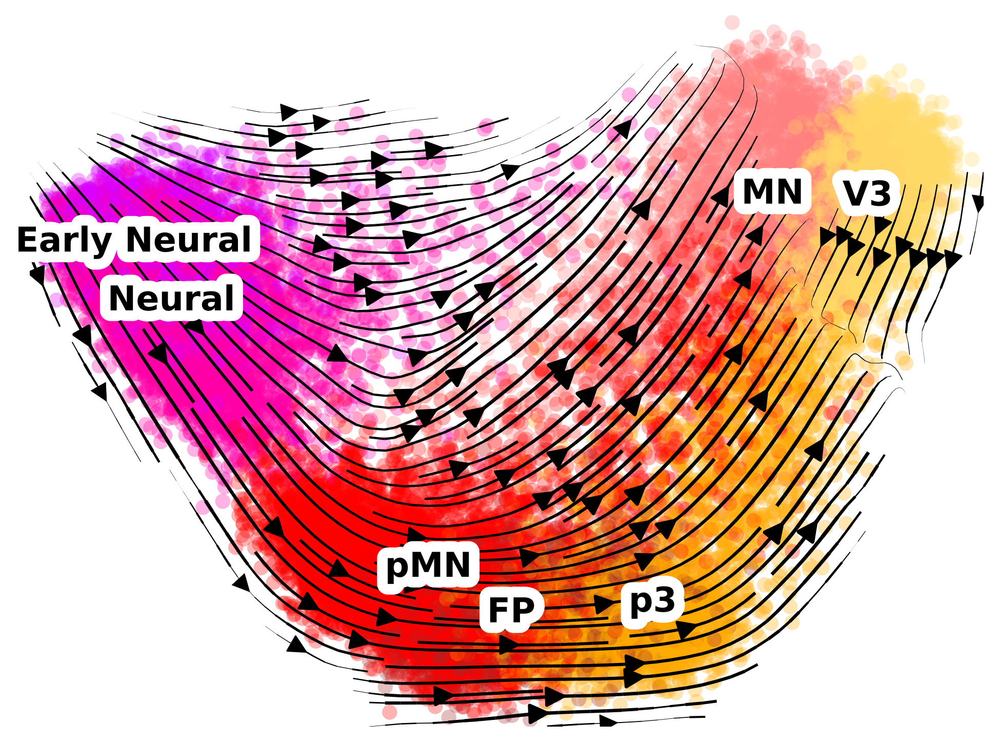

In [42]:
X = model.adata_manager.get_from_registry("X")
X = X.A if issparse(X) else X
torch_device = 'cuda' if torch.cuda.is_available() else 'cpu'

x = torch.tensor(X, device=torch_device)
b = torch.zeros(X.shape[0], device=torch_device)

z = model.module.inference(x, b)['z']
v = model.module.vf(z)

pca = PCA(n_components=10)
zs = z.detach().cpu().numpy()
zfs = (z+v).detach().cpu().numpy()
z_pca = pca.fit_transform(zs)
zf_pca = pca.transform(zfs)
v_pca = zf_pca - z_pca

copy = model.adata.copy()
copy.obsm['X_vae'] = z_pca
copy.obsm['velocity_vae'] = v_pca
copy.uns["velocity_params"] = {'embeddings':'vae'}

fig = plt.figure(figsize=(8,6), dpi=300)

ax = fig.subplots()

scv.pl.velocity_embedding_stream(
    copy, 
    basis='vae', 
    title="",
    color='cell_annotation', 
    show=False,
    ax=ax,
    palette=colpal.celltype,
    arrow_size=2,
    legend_fontoutline=10,
    size=200,
    fontsize=16, 
    legend_fontsize=16, components='1,2'
)
plt.savefig('../figures/2.0.2.3_neural_splicing_with_NC.png', transparent=True)
plt.show()

In [45]:
vt.md.Svelvet.setup_anndata(neural, x_layer='total', u_layer='unspliced', knn_layer='knn_index')

model2 = vt.md.Svelvet(
    neural,
    n_latent = 50,
    linear_decoder = True,
    neighborhood_space="none",
    gamma_mode = "learned",
)

model2.setup_model()

model2.train(
    batch_size = neural.shape[0],
    max_epochs = 200, 
    freeze_vae_after_epochs = 201,
    constrain_vf_after_epochs = 201,
    lr=0.001,
)

INFO     Generating sequential column names                                                                        


bypassing sigterm
bypassing sigterm
bypassing sigterm
Multiprocessing is handled by SLURM.
bypassing sigterm
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
bypassing sigterm
bypassing sigterm
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 200/200: 100%|██████████| 200/200 [01:45<00:00,  2.07it/s, loss=1.84e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 200/200: 100%|██████████| 200/200 [01:45<00:00,  1.90it/s, loss=1.84e+03, v_num=1]


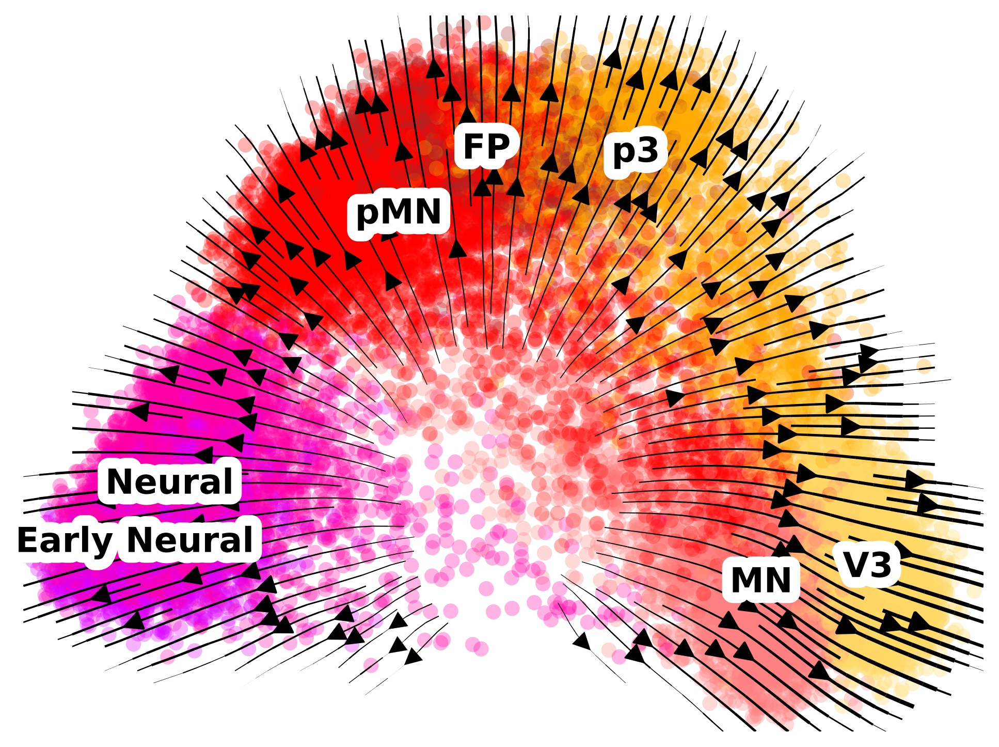

In [46]:
X = model2.adata_manager.get_from_registry("X")
X = X.A if issparse(X) else X
torch_device = 'cuda' if torch.cuda.is_available() else 'cpu'

x = torch.tensor(X, device=torch_device)
b = torch.zeros(X.shape[0], device=torch_device)

z = model2.module.inference(x, b)['z']
v = model2.module.vf(z)

pca = PCA(n_components=10)
zs = z.detach().cpu().numpy()
zfs = (z+v).detach().cpu().numpy()
z_pca = pca.fit_transform(zs)
zf_pca = pca.transform(zfs)
v_pca = zf_pca - z_pca

copy = model2.adata.copy()
copy.obsm['X_vae'] = z_pca
copy.obsm['velocity_vae'] = v_pca
copy.uns["velocity_params"] = {'embeddings':'vae'}

fig = plt.figure(figsize=(8,6), dpi=300)

ax = fig.subplots()

scv.pl.velocity_embedding_stream(
    copy, 
    basis='vae', 
    title="",
    color='cell_annotation', 
    show=False,
    ax=ax,
    palette=colpal.celltype,
    arrow_size=2,
    legend_fontoutline=10,
    size=200,
    fontsize=16, 
    legend_fontsize=16, components='1,2'
)
plt.savefig('../figures/2.0.2.5_neural_splicing_no_NC.png', transparent=True)
plt.show()

Neur

# NMPs 

In [3]:
nmp = sc.read_h5ad('../data/nmp_data_1606.h5ad')

vt.ut.set_seed(0)

vt.md.Velvet.setup_anndata(nmp, x_layer='total', n_layer='new', knn_layer='knn_index')

model = vt.md.Velvet(
    nmp,
    n_latent = 50,
    linear_decoder = True,
    neighborhood_space="latent_space",
    biophysical_model = "full",
    gamma_mode = "learned",
    labelling_time = 2.0,
)

model.setup_model()

INFO     Generating sequential column names                                                  


In [5]:
model.train(
    batch_size = nmp.shape[0],
    max_epochs = 1000, 
    freeze_vae_after_epochs = 200,
    constrain_vf_after_epochs = 200,
    lr=0.001,
)

Multiprocessing is handled by SLURM.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 1000/1000: 100%|██████████| 1000/1000 [09:48<00:00,  1.67it/s, loss=1.94, v_num=1]  

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [09:48<00:00,  1.70it/s, loss=1.94, v_num=1]


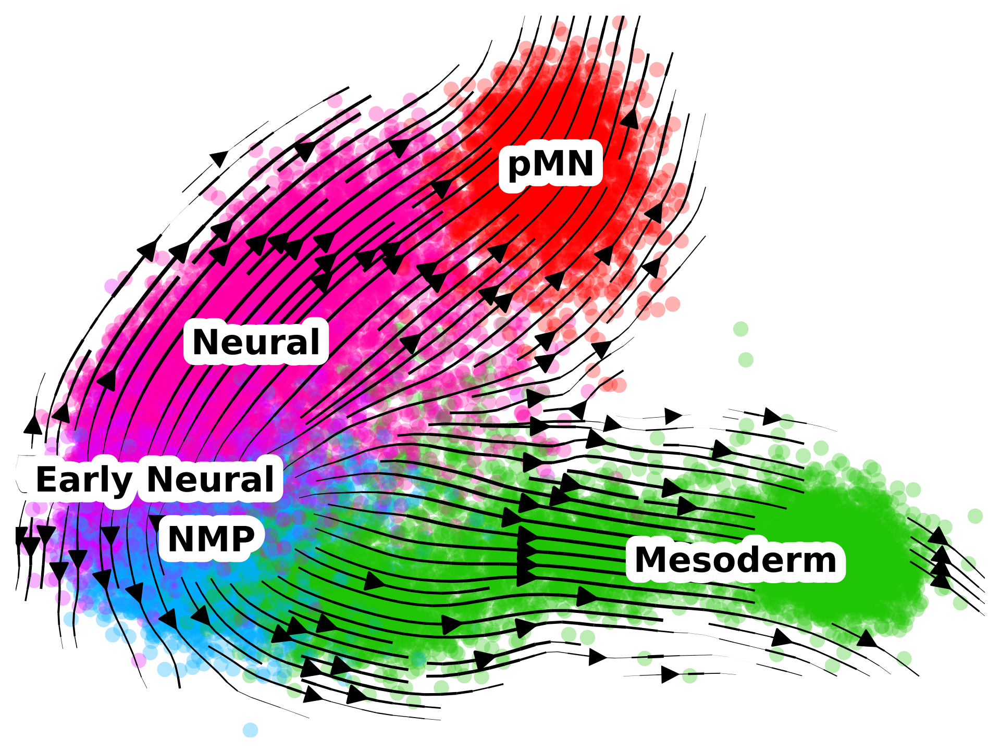

In [7]:
X = model.adata_manager.get_from_registry("X")
X = X.A if issparse(X) else X
torch_device = 'cuda' if torch.cuda.is_available() else 'cpu'

x = torch.tensor(X, device=torch_device)
b = torch.zeros(X.shape[0], device=torch_device)

z = model.module.inference(x, b)['z']
v = model.module.vf(z)

pca = PCA(n_components=10)
zs = z.detach().cpu().numpy()
zfs = (z+v).detach().cpu().numpy()
z_pca = pca.fit_transform(zs)
zf_pca = pca.transform(zfs)
v_pca = zf_pca - z_pca

copy = model.adata.copy()
copy.obsm['X_vae'] = z_pca
copy.obsm['velocity_vae'] = v_pca
copy.uns["velocity_params"] = {'embeddings':'vae'}

fig = plt.figure(figsize=(8,6), dpi=300)

ax = fig.subplots()

scv.pl.velocity_embedding_stream(
    copy, 
    basis='vae', 
    title="",
    color='cell_annotation', 
    show=False,
    ax=ax,
    palette=colpal.celltype,
    arrow_size=2,
    legend_fontoutline=10,
    size=200,
    fontsize=16, 
    legend_fontsize=16, components='1,2'
)
plt.savefig('../figures/2.0.2.1_NMP_labelling_with_NC.png', transparent=True)
plt.show()

In [8]:
nmp = sc.read_h5ad('../data/nmp_data_1606.h5ad')

vt.ut.set_seed(0)

vt.md.Velvet.setup_anndata(nmp, x_layer='total', n_layer='new', knn_layer='knn_index')

model = vt.md.Velvet(
    nmp,
    n_latent = 50,
    linear_decoder = True,
    neighborhood_space="none",
    biophysical_model = "full",
    gamma_mode = "learned",
    labelling_time = 2.0,
)

model.setup_model()

INFO     Generating sequential column names                                                  


In [9]:
model.train(
    batch_size = nmp.shape[0],
    max_epochs = 1000, 
    freeze_vae_after_epochs = 200,
    constrain_vf_after_epochs = 200,
    lr=0.001,
)

Multiprocessing is handled by SLURM.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 1000/1000: 100%|██████████| 1000/1000 [09:57<00:00,  1.70it/s, loss=1.17, v_num=1]  

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [09:57<00:00,  1.67it/s, loss=1.17, v_num=1]


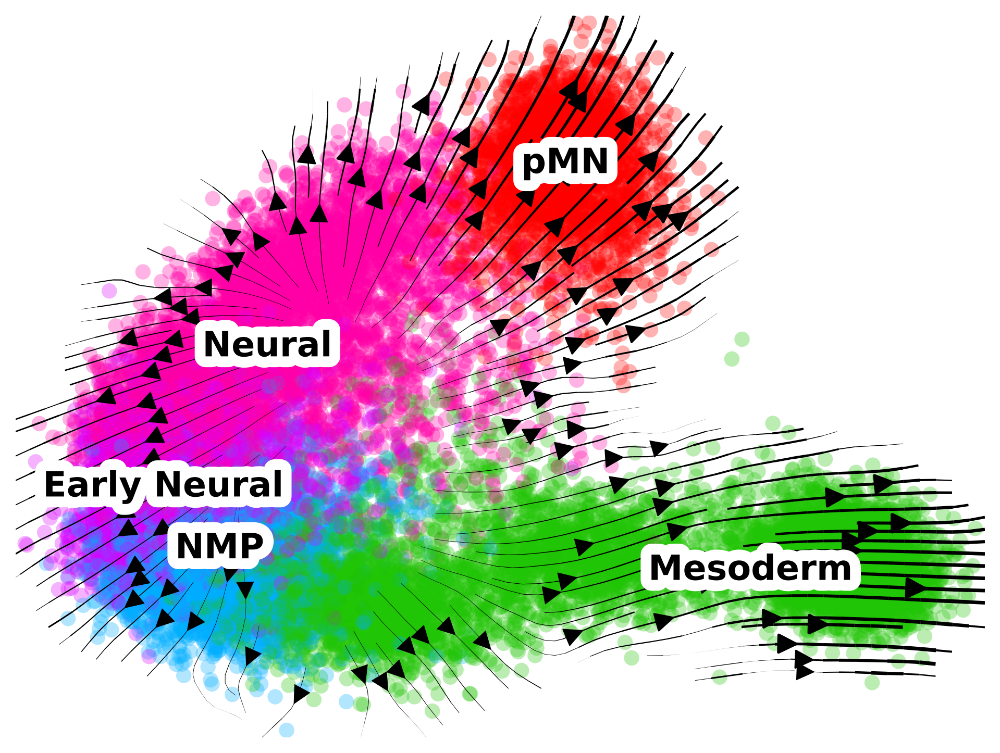

In [10]:
X = model.adata_manager.get_from_registry("X")
X = X.A if issparse(X) else X
torch_device = 'cuda' if torch.cuda.is_available() else 'cpu'

x = torch.tensor(X, device=torch_device)
b = torch.zeros(X.shape[0], device=torch_device)

z = model.module.inference(x, b)['z']
v = model.module.vf(z)

pca = PCA(n_components=10)
zs = z.detach().cpu().numpy()
zfs = (z+v).detach().cpu().numpy()
z_pca = pca.fit_transform(zs)
zf_pca = pca.transform(zfs)
v_pca = zf_pca - z_pca

copy = model.adata.copy()
copy.obsm['X_vae'] = z_pca
copy.obsm['velocity_vae'] = v_pca
copy.uns["velocity_params"] = {'embeddings':'vae'}

fig = plt.figure(figsize=(8,6), dpi=300)

ax = fig.subplots()

scv.pl.velocity_embedding_stream(
    copy, 
    basis='vae', 
    title="",
    color='cell_annotation', 
    show=False,
    ax=ax,
    palette=colpal.celltype,
    arrow_size=2,
    legend_fontoutline=10,
    size=200,
    fontsize=16, 
    legend_fontsize=16, components='1,2'
)
plt.savefig('../figures/2.0.2.1_NMP_labelling_without_NC.png', transparent=True)
plt.show()

In [13]:
nmp = sc.read_h5ad('../data/nmp_data_1606.h5ad')

vt.ut.set_seed(0)

vt.md.Velvet.setup_anndata(nmp, x_layer='total', n_layer='new', knn_layer='knn_index')

model = vt.md.Velvet(
    nmp,
    n_latent = 50,
    linear_decoder = True,
    neighborhood_space="latent_space",
    biophysical_model = "simple",
    gamma_mode = "learned",
    labelling_time = 2.0,
)

model.setup_model()

INFO     Generating sequential column names                                                  


In [14]:
model.train(
    batch_size = nmp.shape[0],
    max_epochs = 1000, 
    freeze_vae_after_epochs = 200,
    constrain_vf_after_epochs = 200,
    lr=0.001,
)

Multiprocessing is handled by SLURM.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 1000/1000: 100%|██████████| 1000/1000 [08:42<00:00,  1.91it/s, loss=1.93, v_num=1]  

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [08:42<00:00,  1.91it/s, loss=1.93, v_num=1]


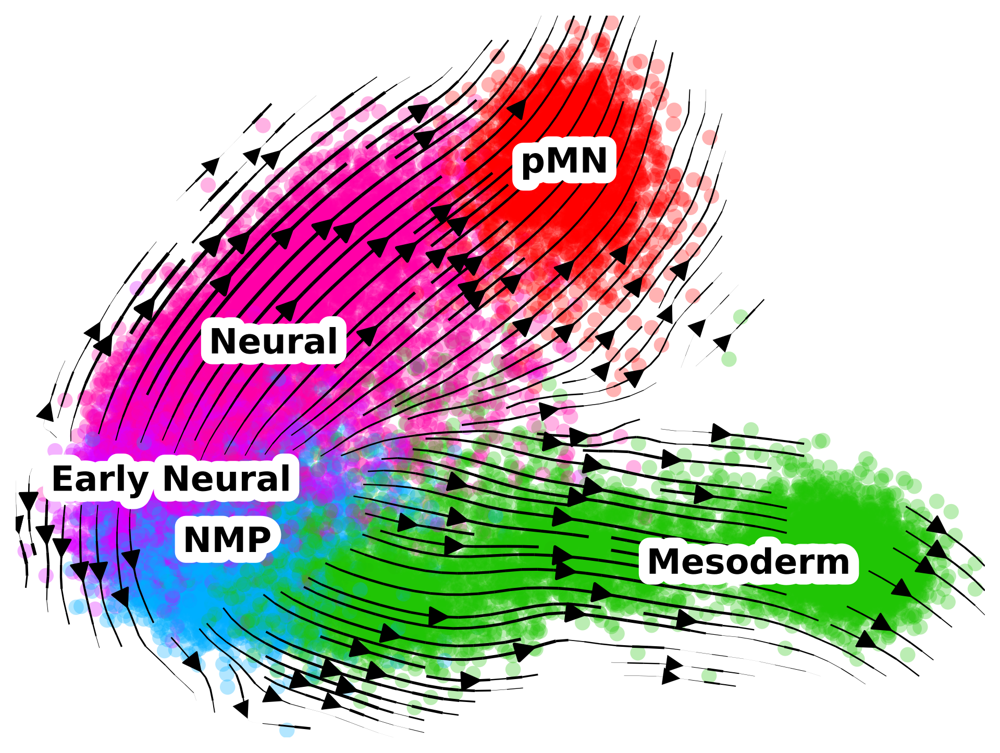

In [15]:
X = model.adata_manager.get_from_registry("X")
X = X.A if issparse(X) else X
torch_device = 'cuda' if torch.cuda.is_available() else 'cpu'

x = torch.tensor(X, device=torch_device)
b = torch.zeros(X.shape[0], device=torch_device)

z = model.module.inference(x, b)['z']
v = model.module.vf(z)

pca = PCA(n_components=10)
zs = z.detach().cpu().numpy()
zfs = (z+v).detach().cpu().numpy()
z_pca = pca.fit_transform(zs)
zf_pca = pca.transform(zfs)
v_pca = zf_pca - z_pca

copy = model.adata.copy()
copy.obsm['X_vae'] = z_pca
copy.obsm['velocity_vae'] = v_pca
copy.uns["velocity_params"] = {'embeddings':'vae'}

fig = plt.figure(figsize=(8,6), dpi=300)

ax = fig.subplots()

scv.pl.velocity_embedding_stream(
    copy, 
    basis='vae', 
    title="",
    color='cell_annotation', 
    show=False,
    ax=ax,
    palette=colpal.celltype,
    arrow_size=2,
    legend_fontoutline=10,
    size=200,
    fontsize=16, 
    legend_fontsize=16, components='1,2'
)
plt.savefig('../figures/2.0.2.1_NMP_labelling_simple_model.png', transparent=True)
plt.show()